<a href="https://colab.research.google.com/github/ze-16/cancer-mortality-and-survival-projection/blob/main/Zarar_Ehsan_Notebook3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



*   Notebook Author: Zarar Ehsan
*   Notebook reviewer: Zahir Chaudhery



Reviewer checks performed:



*   Classification report check
*   AUC-ROC check

*   Confusion matric check





Review Date: 26/03/2025

Reviewer recommendations:


1.   Improve classification report check
2.   Impplement AUC-ROC on some of the models missing AUC-ROC



In [ ]:
# 1.
import pandas as pd
#Importing pandas library to access and load my dataset.

# 6.
from sklearn.model_selection import train_test_split
#Import library to randomly sample traiing data and test data and split the data into two subsets for Machine learning algorithm.

# 8.
from sklearn.ensemble import VotingClassifier
#Python library to initiate the voting ensemble classifier into environment.

# Seminar 8 page 5 part 3 (standard scaler).
from sklearn.preprocessing import StandardScaler
#Importing library to initiate standardscaler into environment.

# 9.
from sklearn.linear_model import LogisticRegression
#Importing library to initiate the logistic regression modelling algorithm to predict a patients mortality status.

# 27.
from sklearn.naive_bayes import GaussianNB
#Initiating a library and Naive bayes algorithm.



# 20.
from sklearn.neighbors import KNeighborsClassifier
#Importing library to initiate the K-nearest neighbours modelling algorithm to predict a patients mortality status.





# 17.
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
#Importing library to initiate confusion matrix into environment.
#Importing library to display confusion matrix.


# 18.
from sklearn.metrics import classification_report
#Importing library to initiate classification report into environment.

# 19.
from sklearn.metrics import RocCurveDisplay
#Importing library to initiate AUC-ROC graphical performance metric.

Code reuse session 3 code blocks;1,6,8

Seminar 8 page 5 part 3 (standard scaler)

Code reuse session 2 code block;9,27

Code reuse session 2 code block;20



Code reuse session 2 code block;17,18,19





In [ ]:
Catdata = pd.read_csv('/content/CatDATASET.csv')
Regdata = pd.read_csv('/content/RegDATASET.csv')
#Method to load in dataset and set it to variable Catdata and Regdata.

Code reuse session 3 code block 2

In [ ]:
Catdata.head()
#Method to access and display recorded values per variable.

,Age,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,68.0,1,1,1,1,3,1,4.0,1,1,24.0,1,60,1
1,50.0,2,2,2,2,2,1,35.0,1,1,14.0,5,62,1
2,58.0,3,3,3,2,2,1,63.0,1,1,14.0,7,75,1
3,58.0,1,1,1,1,3,1,18.0,1,1,2.0,1,84,1
4,47.0,2,1,4,1,3,1,41.0,1,1,3.0,1,50,1


Code reuse session 3 code block 3

In [ ]:
Catdata.info()
#Method for exploring datatypes for all variables in the dataset.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4006 entries, 0 to 4005
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     4006 non-null   float64
 1   T_Stage                 4006 non-null   int64  
 2   N_Stage                 4006 non-null   int64  
 3   6th_Stage               4006 non-null   int64  
 4   Differentiated          4006 non-null   int64  
 5   Grade                   4006 non-null   int64  
 6   A_Stage                 4006 non-null   int64  
 7   Tumor_Size              4006 non-null   float64
 8   Estrogen_Status         4006 non-null   int64  
 9   Progesterone_Status     4006 non-null   int64  
 10  Regional_Node_Examined  4006 non-null   float64
 11  Reginol_Node_Positive   4006 non-null   int64  
 12  Survival_Months         4006 non-null   int64  
 13  Mortality_Status        4006 non-null   int64  
dtypes: float64(3), int64(11)
memory usage: 4

Code reuse session 3 code block 4

In [ ]:
feature_cols = ['Age', 'T_Stage', 'N_Stage', '6th_Stage', 'Differentiated','Grade','A_Stage','Tumor_Size',
                'Estrogen_Status','Progesterone_Status','Regional_Node_Examined','Reginol_Node_Positive','Survival_Months']

X = Catdata[feature_cols]

y = Catdata['Mortality_Status']
#Declaring input features and target features into environment.
#Print statements to list these input and target features.

Code reuse session 2 code block 6

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3, random_state=14, stratify=y)
print('X_Train instances', X_train.shape)
print('X_Test instances', X_test.shape)
#Method to ensure dataset gets sampled into training
#and test subsets with a ratio of my choice and ensuring the reproducibility of the sampling.

X_Train instances (2804, 13)
X_Test instances (1202, 13)


Code reuse session 3 code block 7

In [ ]:
sc = StandardScaler()
scaler = sc.fit(X_train)
Xn_train = scaler.transform(X_train)
Xn_test = scaler.transform(X_test)
#Using previously initiated library to scale my dataset using standard scaler
#To help improve performance of upcoming Machine learning algorithms

Seminar 8 page 5 part 3 (standard scaler)

In [ ]:
lg = LogisticRegression()
lg.fit(Xn_train, y_train)
#Declaring logistic regression algorithm into environment
#Function to estimate logistic regression learnable parameters using scaled train datset

LogisticRegression()

Code reuse session 2 code block 10,11

In [ ]:
y_pred=lg.predict(Xn_test)
#Function to predict mortality status of patients in the isolated scaled test data subset

Code reuse session 2 code block 13

              precision    recall  f1-score   support

           1       0.90      0.98      0.94      1018
           2       0.76      0.42      0.54       184

    accuracy                           0.89      1202
   macro avg       0.83      0.70      0.74      1202
weighted avg       0.88      0.89      0.88      1202



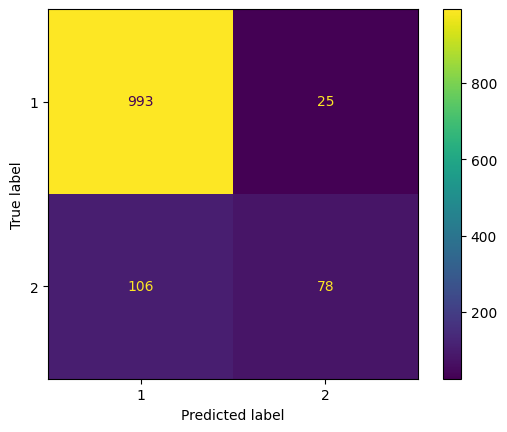

In [ ]:
cm = confusion_matrix(y_test, y_pred, labels = lg.classes_)
#To assess how well the model predicted the mortality status of cancer patients in the unseen data subset
#Calculate and create a confusion matrix


disp = ConfusionMatrixDisplay(cm, display_labels = lg.classes_)
#Displaying foundation-combined performance metrics in a sngle report.
print(classification_report(y_test, y_pred))
disp.plot()

Code reuse session 2 code block 17,18

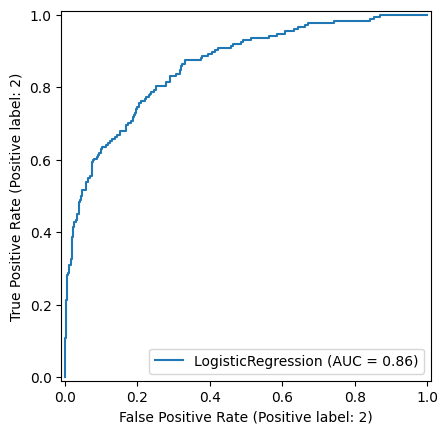

In [ ]:
logreg_auc = RocCurveDisplay.from_estimator(lg, Xn_test, y_test)
#Function to display AUC-ROC to see how well the model distinguishes between dead and alive mortality classes

Code reuse session 3 code block 15

In [ ]:
#Declaring K-nearest neighbour modelling algorithm into environment
knn = KNeighborsClassifier(n_neighbors = 9)
#Building Knn model using scaled training data subset
knn.fit(Xn_train,y_train)
#Function to predict mortality status of patients in the isolated scaled test data subset
yk_pred=knn.predict(Xn_test)

Code reuse session 2 code block 21,22,23

              precision    recall  f1-score   support

           1       0.88      0.97      0.92      1018
           2       0.63      0.24      0.35       184

    accuracy                           0.86      1202
   macro avg       0.76      0.61      0.64      1202
weighted avg       0.84      0.86      0.84      1202



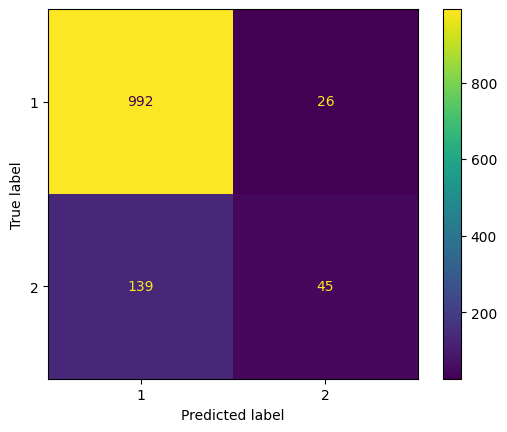

In [ ]:
cm_knn = confusion_matrix(y_test, yk_pred, labels = knn.classes_)
#To assess how well the model predicted the mortality status of cancer patients in the unseen data subset
#Calculate and create a confusion matrix


disp_knn_cm = ConfusionMatrixDisplay(cm_knn, display_labels=knn.classes_)
#Displaying foundation-combined performance metrics in a sngle report.
print(classification_report(y_test, yk_pred))
disp_knn_cm.plot()

Code reuse session 2 code block 17,18

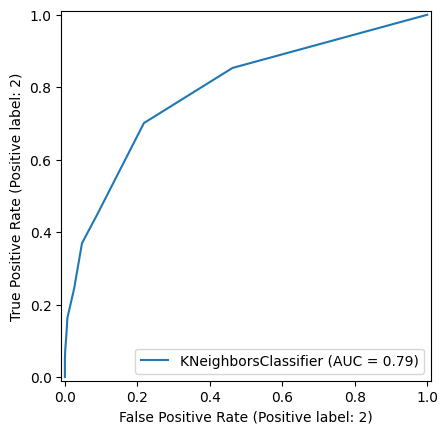

In [ ]:
knn_auc = RocCurveDisplay.from_estimator(knn, Xn_test, y_test)
#Function to display AUC-ROC to see how well the model distinguishes between dead and alive mortality classes

Code reuse session 3 code block 15

In [ ]:
nb = GaussianNB()

nb.fit(Xn_train, y_train)
#Initiating Naive bayes algorithm
#Building/training Naive Bayes classification model

GaussianNB()

Code reuse session 2 code block 27

In [ ]:
yn_pred=nb.predict(Xn_test)
#Function to predict mortality status of patients in the isolated scaled test data subset

Code reuse session 2 code block 13, for NB

              precision    recall  f1-score   support

           1       0.90      0.87      0.88      1018
           2       0.39      0.46      0.42       184

    accuracy                           0.81      1202
   macro avg       0.64      0.66      0.65      1202
weighted avg       0.82      0.81      0.81      1202



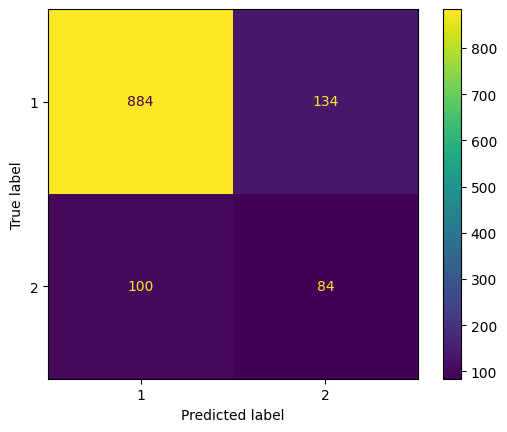

In [ ]:
#Displaying foundation-combined performance metrics in a sngle report.
print(classification_report(y_test, yn_pred))

#To assess how well the model predicted the mortality status of cancer patients in the unseen data subset
#Calculate and create a confusion matrix
nb_cm = confusion_matrix(y_test, yn_pred, labels = nb.classes_)
nb_cm = ConfusionMatrixDisplay(nb_cm, display_labels = nb.classes_)
nb_cm.plot()

Code reuse session 2 code block 17,18

In [ ]:
base_learners=[('KNN', knn), ('LR', lg)]

ensemble_learner = VotingClassifier(base_learners, voting='soft')
#Built dictionary of base learners to combine into an ensemble learner
#Dictionary used by voting classifier

Code reuse session 3 code block 9

In [ ]:
ensemble_learner.fit(Xn_train, y_train)
#Ensemble learner trained using scaled dataset

VotingClassifier(estimators=[('KNN', KNeighborsClassifier(n_neighbors=9)),
                             ('LR', LogisticRegression())],
                 voting='soft')

Code reuse session 3 code block 10

In [ ]:
y_pred_ensemble_learner = ensemble_learner.predict(Xn_test)
#Function to predict mortality status of patients in the isolated scaled test data subset

Code reuse session 3 code block 11

In [ ]:
from sklearn.metrics import accuracy_score



ensemble_learner_accuracy = accuracy_score(y_test, y_pred_ensemble_learner)



print ("The voting ensemble classifier accuracy is: ", ensemble_learner_accuracy)
#Initiating the required library and function then calculating and presenting the accuracy score for test dataset

The voting ensemble classifier accuracy is:  0.8826955074875208


Code reuse session 3 code block 12

Ensemble Learner Classification Report 
               precision    recall  f1-score   support

           1       0.89      0.98      0.93      1018
           2       0.76      0.34      0.47       184

    accuracy                           0.88      1202
   macro avg       0.83      0.66      0.70      1202
weighted avg       0.87      0.88      0.86      1202



Text(0.5, 1.0, 'Ensemble Learner Confusion Matrix')

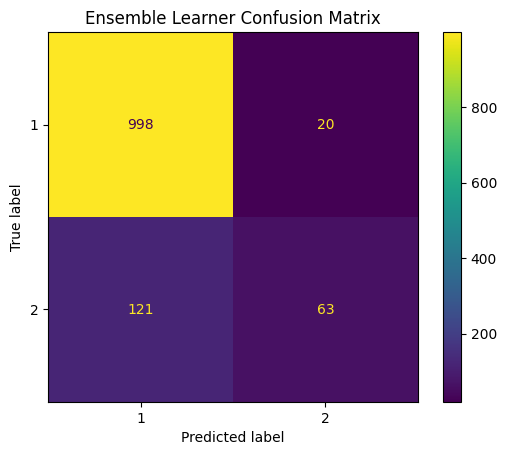

In [ ]:
#To assess how well the model predicted the mortality status of cancer patients in the unseen data subset
#Calculate and create a confusion matrix
ensemble_learner_cm_test = confusion_matrix(y_test, y_pred_ensemble_learner, labels=ensemble_learner.classes_)



ensemble_learner_disp = ConfusionMatrixDisplay(ensemble_learner_cm_test,display_labels=ensemble_learner.classes_)



ensemble_learner_disp.plot()

#Displaying foundation-combined performance metrics in a sngle report.
print("Ensemble Learner Classification Report \n", classification_report(y_test, y_pred_ensemble_learner))
ensemble_learner_disp.ax_.set_title("Ensemble Learner Confusion Matrix")

Code reuse session 3 code block 13.14

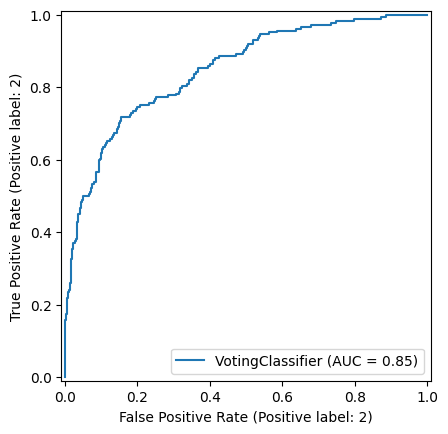

In [ ]:
ensemble_learner = RocCurveDisplay.from_estimator(ensemble_learner, Xn_test, y_test)
#Function to display AUC-ROC to see how well the model distinguishes between dead and alive mortality classes

Code reuse session 3 code block 15

In [ ]:
Regdata.head()
#Method to access and display recorded values per variable.

,Age,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months
0,40.0,2,1,4,2,2,1,30.0,1,1,9.0,1,14
1,68.0,1,1,1,2,2,1,13.0,1,1,9.0,1,64
2,57.0,3,3,3,2,2,1,70.0,1,1,12.0,12,42
3,42.0,1,3,3,2,2,1,9.0,2,2,15.0,2,39
4,67.0,1,1,1,2,2,1,13.0,1,1,16.0,3,60


Code reuse session 3 code block 3

In [ ]:
Regdata.info()
#Method for exploring datatypes for all variables in the dataset.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     614 non-null    float64
 1   T_Stage                 614 non-null    int64  
 2   N_Stage                 614 non-null    int64  
 3   6th_Stage               614 non-null    int64  
 4   Differentiated          614 non-null    int64  
 5   Grade                   614 non-null    int64  
 6   A_Stage                 614 non-null    int64  
 7   Tumor_Size              614 non-null    float64
 8   Estrogen_Status         614 non-null    int64  
 9   Progesterone_Status     614 non-null    int64  
 10  Regional_Node_Examined  614 non-null    float64
 11  Reginol_Node_Positive   614 non-null    int64  
 12  Survival_Months         614 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 62.5 KB


Code reuse session 3 page 2 code block 3

In [ ]:
Xr = Regdata.drop('Survival_Months', axis=1)

yr = Regdata['Survival_Months']
#Code block declares "Survival_Months" as Target feature and the rest of the data as input features

Code reuse session 3 page 2 code block 4

In [ ]:
Xr_train,Xr_test,yr_train,yr_test = train_test_split(Xr, yr, test_size=0.3, random_state=15)
#Method to ensure dataset gets sampled into training
#and test subsets with a ratio of my choice and ensuring the reproducibility of the sampling.

Code reuse session 3 page 2 code block 5

In [ ]:
from sklearn.tree import DecisionTreeRegressor
#Importing python library to initiate  regression decision tree

Code reuse session 3 page 2 code block 6

In [ ]:
DT_regressor = DecisionTreeRegressor()

DT_regressor.fit(Xr_train, yr_train)
#Initiating decision tree regressor and training the algorithm on Data

DecisionTreeRegressor()

Code reuse session 3 page 2 code block 7

In [ ]:
yr_pred = DT_regressor.predict(Xr_test)
#Function to predict mortality status of patients in the isolated scaled test data subset

Code reuse session 3 page 2 code block 8

In [ ]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(yr_test, yr_pred))

print('MSE:', metrics.mean_squared_error(yr_test, yr_pred))

print('R2:', metrics.r2_score(yr_test, yr_pred))
#Initiating python library to obtain regression performance metrics
#Calculating and displaying Metrics such as MAE,MSE and R squared

MAE: 27.216216216216218
MSE: 1136.4594594594594
R2: -1.011926363955188


Code reuse session 3 page 2 code block 9

In [ ]:
from sklearn import tree

from matplotlib import pyplot as plt
#Initiating data visualisation libraries to plot my decision tree

Code reuse session 3 page 2 code block 10

In [ ]:
Tree_figure = plt.figure(figsize=(200,200))

DT_Graph = tree.plot_tree(DT_regressor, feature_names=list(Xr_train.columns), filled=True)
#Plotting decision tree for survival months

Code reuse session 3 page 2 code block 11

In [ ]:
Tree_figure.savefig("decistion_tree.svg")
#Saving decision tree as a high resolution image

Code reuse session 3 page 2 code block 12

In [ ]:
DT2_regressor = DecisionTreeRegressor(max_depth=4)

DT2_regressor.fit(Xr_train, yr_train)

yr2_pred = DT2_regressor.predict(Xr_test)
#Initiating decision tree regressor and training the algorithm on Data using a pre-defined depth of 4
#Function to predict mortality status of patients in the isolated scaled test data subset

Code reuse session 3 page 2 code block 13

In [ ]:
print('MAE:', metrics.mean_absolute_error(yr_test, yr2_pred))

print('MSE:', metrics.mean_squared_error(yr_test, yr2_pred))

print('R2:', metrics.r2_score(yr_test, yr2_pred))
#Initiating python library to obtain regression performance metrics
#Calculating and displaying Metrics such as MAE,MSE and R squared

MAE: 20.973486792678283
MSE: 635.0087638159794
R2: -0.12418517231721582


Code reuse session 3 page 2 code block 9

In [ ]:
Tree2_figure = plt.figure(figsize=(200,200))

DT2_Graph = tree.plot_tree(DT2_regressor, feature_names=list(Xr_train.columns), filled=True)
Tree2_figure.savefig("decistion_tree2.svg")
#Plotting decision tree for survival months
#Saving decision tree as a high resolution image

Code reuse session 3 page 2 code block 11,12